In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
import seaborn as sns
%matplotlib inline

test_csv = (os.path.join("../Data", "test-full.csv"))
train_csv = (os.path.join("../Data", "train.csv"))

train_df = pd.read_csv(train_csv)
test_df = pd.read_csv(test_csv)

# 1 - EDA 
Below i will generate some plots

In [2]:
train_df.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,242642,2881,130,22,210,54,1020,250,221,88,...,0,0,0,0,0,0,0,0,0,1
1,309891,3005,351,14,242,-16,1371,194,215,159,...,0,0,0,0,0,0,0,0,0,1
2,287847,3226,63,14,618,2,1092,232,210,107,...,0,0,0,0,0,0,0,0,0,1
3,516307,3298,317,8,661,60,752,198,233,174,...,0,0,0,0,0,0,0,0,0,1
4,124860,3080,35,6,175,26,3705,219,227,144,...,0,0,0,0,0,0,0,0,0,1


In [3]:
train_df.columns

Index(['Id', 'Elevation', 'Aspect', 'Slope',
       'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology',
       'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon',
       'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points',
       'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3',
       'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3',
       'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8',
       'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
       'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
       'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
       'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
       'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
       'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
       'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
       'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_

In [4]:
train_df.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,...,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,267008.526389,2748.649934,155.834524,16.556746,228.376521,51.311706,1717.977712,213.028836,218.865741,134.477116,...,0.043849,0.040939,0.001190,0.006812,0.000926,0.002116,0.049206,0.041931,0.030159,4.000000
std,179261.722330,419.009589,109.745372,8.534602,209.196381,61.520488,1330.263450,30.638406,22.797288,46.070054,...,0.204766,0.198156,0.034484,0.082257,0.030416,0.045957,0.216306,0.200439,0.171030,2.000066
min,5.000000,1877.000000,0.000000,0.000000,0.000000,-135.000000,0.000000,52.000000,99.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,103705.000000,2373.000000,65.000000,10.000000,67.000000,5.000000,760.000000,197.000000,207.000000,106.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,276034.500000,2754.000000,125.000000,15.000000,180.000000,32.000000,1315.000000,220.000000,223.000000,138.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,398150.250000,3109.000000,257.000000,22.000000,330.000000,80.000000,2292.000000,236.000000,235.000000,166.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
max,581005.000000,3850.000000,360.000000,50.000000,1376.000000,570.000000,6803.000000,254.000000,254.000000,251.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15120 entries, 0 to 15119
Data columns (total 56 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   Id                                  15120 non-null  int64
 1   Elevation                           15120 non-null  int64
 2   Aspect                              15120 non-null  int64
 3   Slope                               15120 non-null  int64
 4   Horizontal_Distance_To_Hydrology    15120 non-null  int64
 5   Vertical_Distance_To_Hydrology      15120 non-null  int64
 6   Horizontal_Distance_To_Roadways     15120 non-null  int64
 7   Hillshade_9am                       15120 non-null  int64
 8   Hillshade_Noon                      15120 non-null  int64
 9   Hillshade_3pm                       15120 non-null  int64
 10  Horizontal_Distance_To_Fire_Points  15120 non-null  int64
 11  Wilderness_Area1                    15120 non-null  int64
 12  Wild

In [6]:
numerical_variables = ["Elevation", "Aspect", "Slope", "Horizontal_Distance_To_Hydrology", 
                       "Vertical_Distance_To_Hydrology", "Horizontal_Distance_To_Roadways", 
                       "Horizontal_Distance_To_Fire_Points", "Hillshade_9am", 
                       "Hillshade_Noon", "Hillshade_3pm"]

categorical_variables = ["Wilderness_Area1", "Wilderness_Area2", "Wilderness_Area3", "Wilderness_Area4", 
                         "Soil_Type1", "Soil_Type2", "Soil_Type3", "Soil_Type4", "Soil_Type5", "Soil_Type6", 
                         "Soil_Type7", "Soil_Type8", "Soil_Type9", "Soil_Type10", "Soil_Type11", "Soil_Type12", 
                         "Soil_Type13", "Soil_Type14", "Soil_Type15", "Soil_Type16", "Soil_Type17", "Soil_Type18", 
                         "Soil_Type19", "Soil_Type20", "Soil_Type21", "Soil_Type22", "Soil_Type23", "Soil_Type24", 
                         "Soil_Type25", "Soil_Type26", "Soil_Type27", "Soil_Type28", "Soil_Type29", "Soil_Type30",  
                         "Soil_Type31", "Soil_Type32", "Soil_Type33", "Soil_Type34", "Soil_Type35", "Soil_Type36", 
                         "Soil_Type37", "Soil_Type38", "Soil_Type39", "Soil_Type40"]

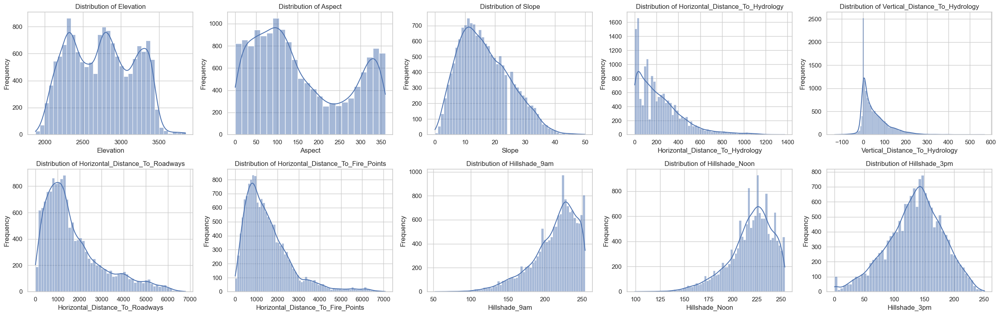

In [7]:
sns.set(style="whitegrid")

n_cols = 5
n_rows = int(np.ceil(len(numerical_variables) / n_cols))

plt.figure(figsize=(n_cols * 5, n_rows * 4))

for i, col in enumerate(numerical_variables):
    plt.subplot(n_rows, n_cols, i+1)
    sns.histplot(train_df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


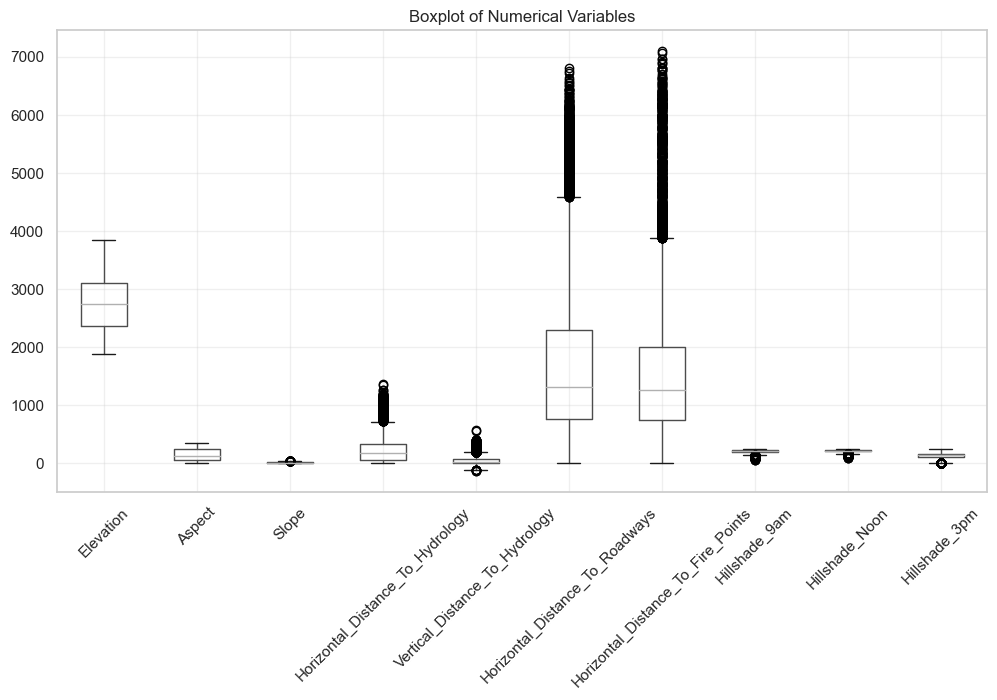

In [8]:
plt.figure(figsize=(12, 6))
train_df[numerical_variables].boxplot()
plt.xticks(rotation=45)
plt.title('Boxplot of Numerical Variables')
plt.grid(True, alpha=0.3)
plt.show()

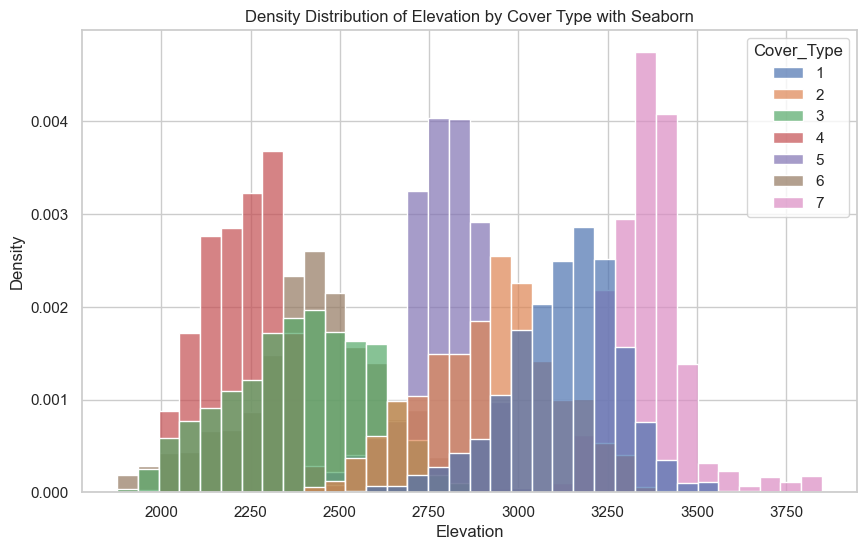

In [9]:
import seaborn as sns

# Using seaborn to plot with 'hue' for different cover types
plt.figure(figsize=(10, 6))
sns.histplot(data=train_df, x='Elevation', hue='Cover_Type', element='bars', stat='density', common_norm=False, palette='deep', alpha=0.7)

plt.title('Density Distribution of Elevation by Cover Type with Seaborn')
plt.xlabel('Elevation')
plt.ylabel('Density')
plt.show()


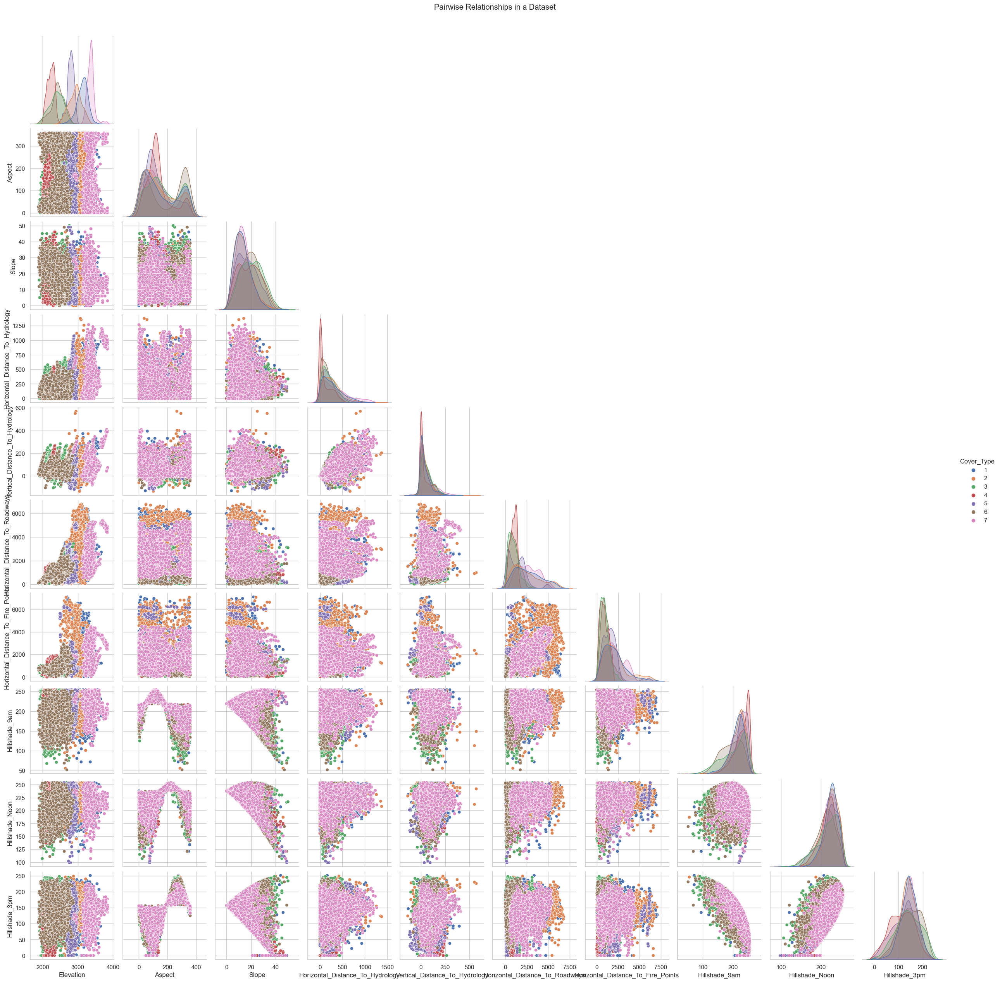

In [10]:
# We will use seaborn's pairplot to create a grid of Axes such that each variable in data will be shared across the y-axes across a single row and the x-axes across a single column.
# The diagonal Axes are treated differently, drawing a plot to show the univariate distribution of the data for the variable in that column.

# It is assumed that 'Cover_Type' is a categorical variable for coloring purposes.
sns.pairplot(train_df[numerical_variables + ['Cover_Type']], hue='Cover_Type', diag_kind='kde', corner=True, palette='deep') # plot_kws={'alpha':0.6, 's': 40, 'edgecolor':'k'},

plt.suptitle('Pairwise Relationships in a Dataset', y=1.02)  # y=1.02 to make space for the title
plt.show()


In [11]:
import plotly.express as px

# Using the train_df DataFrame to create a 3D scatter plot with Plotly
fig = px.scatter_3d(train_df, x='Hillshade_9am', y='Elevation', z='Slope',
                    color='Cover_Type')

# Showing the plot
fig.show()

In [12]:
# import plotly.express as px
# from itertools import combinations

# # List of numerical variables
# numerical_variables = ["Elevation", "Aspect", "Slope", "Horizontal_Distance_To_Hydrology", 
#                        "Vertical_Distance_To_Hydrology", "Horizontal_Distance_To_Roadways", 
#                        "Horizontal_Distance_To_Fire_Points", "Hillshade_9am", 
#                        "Hillshade_Noon", "Hillshade_3pm"]

# # Generate all unique combinations of 3 features
# combinations_of_features = combinations(numerical_variables, 3)

# # Loop through each unique combination and create a 3D scatter plot
# for combo in combinations_of_features:
#     fig = px.scatter_3d(train_df, x=combo[0], y=combo[1], z=combo[2], 
#                         color='Cover_Type', color_continuous_scale='Viridis')

#     # Update layout to 'zoom out'
#     fig.update_layout(
#         title=f'3D Scatter Plot: {combo[0]} vs {combo[1]} vs {combo[2]}',
#         scene=dict(
#             xaxis=dict(range=[train_df[combo[0]].min()*0.9, train_df[combo[0]].max()*1.1]),
#             yaxis=dict(range=[train_df[combo[1]].min()*0.9, train_df[combo[1]].max()*1.1]),
#             zaxis=dict(range=[train_df[combo[2]].min()*0.9, train_df[combo[2]].max()*1.1]),
#             xaxis_title=combo[0],
#             yaxis_title=combo[1],
#             zaxis_title=combo[2]
#         ),
#         margin=dict(l=0, r=0, b=0, t=0) # optional: to make the plot fit tighter within the figure
#     )

#     # Save the figure as an HTML file
#     file_name = f"3D_Scatter_{combo[0]}_{combo[1]}_{combo[2]}.html"
#     fig.write_html(file_name)
#     print(f"Saved {file_name}")


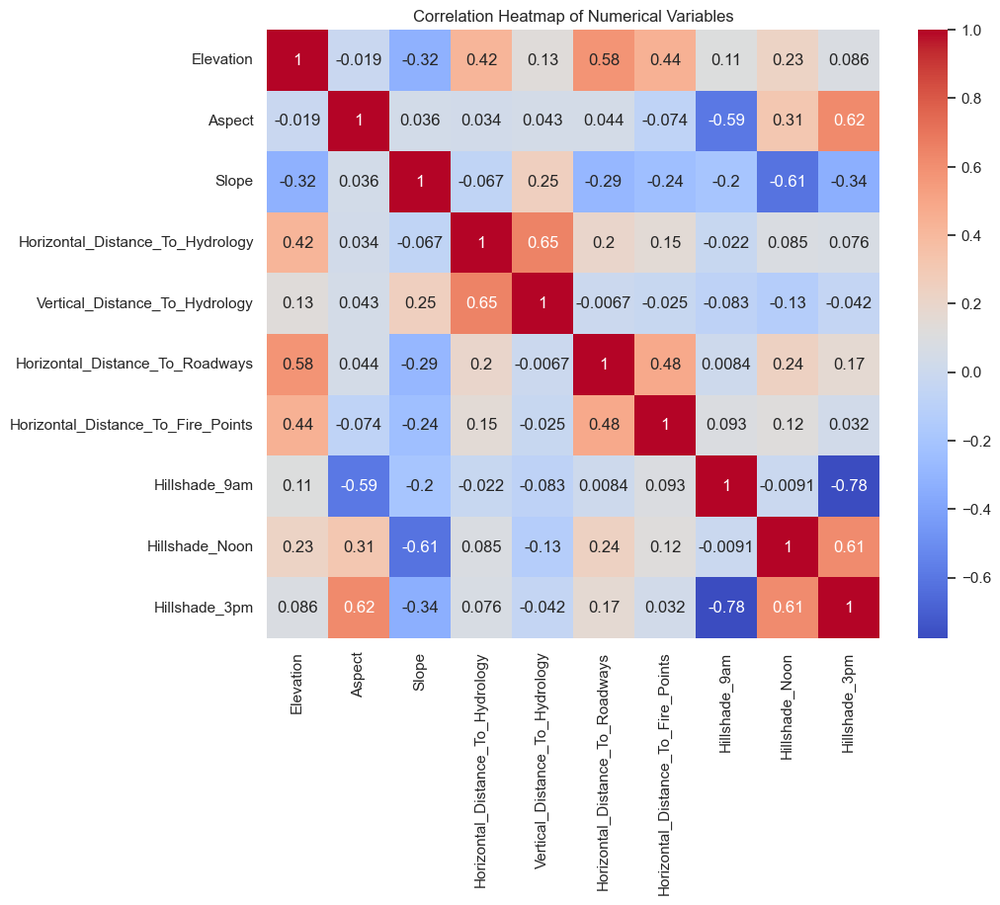

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 8))
correlation_matrix = train_df[numerical_variables].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Numerical Variables')
plt.show()

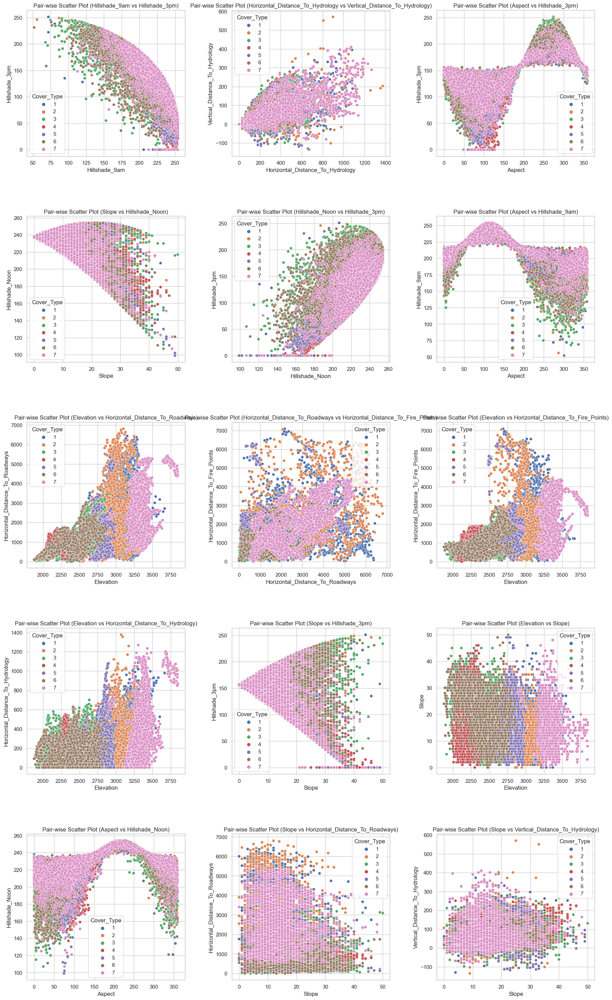

In [14]:

# Get name of the columns
cols = correlation_matrix.columns

# Threshold (only highly correlated ones matter)
threshold = 0.25
corr_list = []

# Sorting out the highly correlated values
for i in range(len(cols)):
    for j in range(i+1, len(cols)):
        if correlation_matrix.iloc[i,j] >= threshold and correlation_matrix.iloc[i,j] < 1 \
        or correlation_matrix.iloc[i,j] < 0 and correlation_matrix.iloc[i,j] <= -threshold:
            corr_list.append([correlation_matrix.iloc[i,j], i, j])

# Sorting the values
s_corr_list = sorted(corr_list, key=lambda x: -abs(x[0]))

# Create a figure and subplots
num_plots = len(s_corr_list)
num_cols = 3  # Number of columns for subplot grid
num_rows = -(-num_plots // num_cols)  # Calculate number of rows required
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 6 * num_rows))  # Adjust figsize here

# Flatten the axes array if it's a single row
if num_rows == 1:
    axes = axes.reshape(1, -1)

# Loop through s_corr_list and create pair-wise scatter plots
for idx, (v, i, j) in enumerate(s_corr_list):
    row_idx = idx // num_cols
    col_idx = idx % num_cols
    ax = axes[row_idx, col_idx]
    sns.scatterplot(data=train_df, x=cols[i], y=cols[j], hue='Cover_Type', palette='deep', ax=ax)
    ax.set_title(f"Pair-wise Scatter Plot ({cols[i]} vs {cols[j]})")

plt.subplots_adjust(hspace=10,wspace=100)  # Adjust the amount of space between subplots
plt.tight_layout()
plt.show()

# 2 - Trying Different Classification Methods on Original Dataset

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

X = train_df.drop(columns=['Id','Cover_Type'])
y = train_df['Cover_Type']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [16]:
class Numerical_Standardizer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.numeric_columns = []
        self.binary_columns = []
        self.scaler = StandardScaler()

    def fit(self, X, y=None):
        # Identify numerical columns excluding binary columns
        self.numeric_columns = X.select_dtypes(include=['number']).columns
        self.binary_columns = [col for col in self.numeric_columns if sorted(X[col].unique()) == [0, 1]]
        self.numeric_columns = [col for col in self.numeric_columns if col not in self.binary_columns]
        
        # Fit the scaler on non-binary numerical columns
        self.scaler.fit(X[self.numeric_columns])
        return self

    def transform(self, X):
        # Standardize non-binary numerical columns
        X_transformed = X.copy()
        X_transformed[self.numeric_columns] = self.scaler.transform(X[self.numeric_columns])
        return X_transformed


# Define the pipeline
pipeline = Pipeline(steps=[
    ('standardizer', Numerical_Standardizer()),
    ('classifier', RandomForestClassifier())
])

# Fit the pipeline and perform 5-fold cross-validation
train_accuracies = cross_val_score(pipeline, X_train, y_train, cv=5)

print("Training Accuracies:", train_accuracies)
print("Mean Training Accuracy:", train_accuracies.mean())

# Fit on the full training data
pipeline.fit(X_train, y_train)

# Calculate testing accuracy
test_accuracy = pipeline.score(X_test, y_test)
print("Testing Accuracy:", test_accuracy)


Training Accuracies: [0.84876033 0.85779248 0.85035138 0.84663084 0.84291029]
Mean Training Accuracy: 0.8492890648755205
Testing Accuracy: 0.8644179894179894


In [127]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import numpy as np
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
import numpy as np

test_csv = (os.path.join("../Data", "test-full.csv"))
train_csv = (os.path.join("../Data", "train.csv"))

train_df = pd.read_csv(train_csv)
test_df = pd.read_csv(test_csv)

X = train_df.drop(columns=['Id','Cover_Type'])
y = train_df['Cover_Type']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=50)

# List of classifiers along with their parameters
classifiers = [
    ('Logistic Regression', {'classifier': LogisticRegression(max_iter=1000), 'regularization': None}),
    # ('Lasso Regularized Logistic Regression', {'classifier': LogisticRegression(penalty='l1', solver='saga', max_iter=1000), 'regularization': 'L1'}),
    # ('Ridge Regularized Logistic Regression', {'classifier': LogisticRegression(penalty='l2', max_iter=1000), 'regularization': 'L2'}),
    # ('Elastic Net Regularized Logistic Regression', {'classifier': LogisticRegression(penalty='elasticnet', solver='saga', max_iter=1000), 'regularization': 'ElasticNet'}),
    ('Random Forest Classifier', {'classifier': RandomForestClassifier(), 'regularization': None}),
    ('Gradient Boosting Classifier', {'classifier': GradientBoostingClassifier(), 'regularization': None}),
    ('XGBoost Classifier', {'classifier': XGBClassifier(), 'regularization': None}),
    ('Extra Trees Classifier', {'classifier': ExtraTreesClassifier(), 'regularization': None}),
]

# Loop through classifiers
for classifier_name, params in classifiers:
    # Define pipeline for each classifier
    if params['regularization'] is None:
        pipeline = Pipeline(steps=[
            ('standardizer', Numerical_Standardizer()),
            ('classifier', params['classifier'])
        ])
    else:
        pipeline = Pipeline(steps=[
            ('standardizer', Numerical_Standardizer()),
            ('classifier', params['classifier'])
        ])

    # Adjust class labels for XGBoost
    if classifier_name == 'XGBoost Classifier':
        # Subtract 1 from the target variable y to ensure class labels start from 0
        y_train_adjusted = y_train - 1
        y_test_adjusted = y_test - 1
    else:
        y_train_adjusted = y_train
        y_test_adjusted = y_test

    # Fit the pipeline and perform 5-fold cross-validation
    train_accuracies = cross_val_score(pipeline, X_train, y_train_adjusted, cv=5)

    print(f"Classifier: {classifier_name}")
    print("Training Accuracies:", train_accuracies)
    print("Mean Training Accuracy:", np.mean(train_accuracies))

    # Fit on the full training data
    pipeline.fit(X_train, y_train_adjusted)

    # Calculate testing accuracy
    test_accuracy = pipeline.score(X_test, y_test_adjusted)
    print("Testing Accuracy:", test_accuracy)
    print()


Classifier: Logistic Regression
Training Accuracies: [0.7019367  0.70571564 0.7104393  0.72555503 0.69139887]
Mean Training Accuracy: 0.7070091071200552
Testing Accuracy: 0.6900352733686067

Classifier: Random Forest Classifier
Training Accuracies: [0.8474256  0.84553614 0.84364667 0.85214927 0.84971645]
Mean Training Accuracy: 0.8476948244162612
Testing Accuracy: 0.8406084656084656

Classifier: Gradient Boosting Classifier
Training Accuracies: [0.80113368 0.78837978 0.79215872 0.80727444 0.78308129]
Mean Training Accuracy: 0.7944055816046711
Testing Accuracy: 0.7764550264550265

Classifier: XGBoost Classifier
Training Accuracies: [0.84411904 0.84695324 0.8375059  0.85262163 0.85018904]
Mean Training Accuracy: 0.8462777693940404
Testing Accuracy: 0.8395061728395061

Classifier: Extra Trees Classifier
Training Accuracies: [0.84506377 0.8445914  0.8474256  0.85545583 0.84451796]
Mean Training Accuracy: 0.8474109133640446
Testing Accuracy: 0.8434744268077602



In [26]:

test_csv = (os.path.join("../Data", "test-full.csv"))
train_csv = (os.path.join("../Data", "train.csv"))

train_df = pd.read_csv(train_csv)
test_df = pd.read_csv(test_csv)

X = train_df.drop(columns=['Id','Cover_Type'])
y = train_df['Cover_Type']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.01, random_state=42)


pipeline = Pipeline(steps=[
    ('standardizer', Numerical_Standardizer()),
    ('classifier', ExtraTreesClassifier(max_features=0.5, n_estimators=900, n_jobs=-1, verbose=1))
])

pipeline.fit(X_train, y_train)

# Calculate testing accuracy
test_accuracy = pipeline.score(X_test, y_test)
print("Testing Accuracy:", test_accuracy)
print()

# Predict cover types on the transformed test set
predictions = pipeline.predict(test_df.drop(columns='Id'))

# Create a DataFrame with predicted cover types and corresponding IDs
result_df = pd.DataFrame({'Id': test_df['Id'], 'Cover_Type': predictions})

# Optionally, save the predictions to a CSV file
result_df.to_csv('ExtraTrees.csv', index=False)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 900 out of 900 | elapsed:    7.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 768 tasks      | elapsed:    0.1s
[Parallel(n_jobs=16)]: Done 900 out of 900 | elapsed:    0.1s finished


Testing Accuracy: 0.8157894736842105



[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.5s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    4.8s
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:   13.6s
[Parallel(n_jobs=16)]: Done 768 tasks      | elapsed:   24.8s
[Parallel(n_jobs=16)]: Done 900 out of 900 | elapsed:   29.1s finished


# HYPER PARAM

In [72]:
import numpy as np
import pandas as pd
from sklearn.base import BaseEstimator, ClassifierMixin, TransformerMixin
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler

# Assuming the data paths are correctly defined and CSV files are loaded
train_df = pd.read_csv(train_csv)
test_df = pd.read_csv(test_csv)

X = train_df.drop(columns=['Id', 'Cover_Type'])
y = train_df['Cover_Type']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state=42)

class NumericalStandardizer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.scaler = StandardScaler()

    def fit(self, X, y=None):
        self.numeric_columns = X.select_dtypes(include=['number']).columns
        self.binary_columns = [col for col in self.numeric_columns if np.array_equal(np.sort(X[col].unique()), [0, 1])]
        self.numeric_columns = [col for col in self.numeric_columns if col not in self.binary_columns]
        self.scaler.fit(X[self.numeric_columns])
        return self

    def transform(self, X):
        X = X.copy()
        X[self.numeric_columns] = self.scaler.transform(X[self.numeric_columns])
        return X

class MajorityVotingEnsemble(BaseEstimator, ClassifierMixin):
    def __init__(self, estimators):
        self.estimators = estimators

    def fit(self, X, y):
        for estimator_name, estimator in self.estimators:
            if estimator_name == 'XGBoost Classifier':
                estimator.fit(X, y - 1)  # Adjusting for XGBoost
            else:
                estimator.fit(X, y)
        return self

    def predict(self, X):
        predictions = np.array([estimator.predict(X) for estimator_name, estimator in self.estimators])
        # Adjust predictions for XGBoost
        for i, (estimator_name, _) in enumerate(self.estimators):
            if estimator_name == 'XGBoost Classifier':
                predictions[i] += 1
        majority_vote = np.apply_along_axis(lambda x: np.argmax(np.bincount(x)), axis=0, arr=predictions)
        return majority_vote

def tune_hyperparameters(classifier_name, classifier, params, X_train, y_train):
    pipeline = Pipeline([
        ('standardizer', NumericalStandardizer()),
        ('classifier', classifier)
    ])
    if classifier_name == 'XGBoost Classifier':
        y_train_adjusted = y_train - 1
        grid_search = GridSearchCV(pipeline, param_grid=params, cv=5, n_jobs=-1)
        grid_search.fit(X_train, y_train_adjusted)
    else:
        grid_search = GridSearchCV(pipeline, param_grid=params, cv=5, n_jobs=-1)
        grid_search.fit(X_train, y_train)
    return classifier_name, grid_search.best_estimator_['classifier']

# Define the classifiers with hyperparameter spaces for tuning
classifiers = [
    ('Random Forest Classifier', RandomForestClassifier(), {'classifier__n_estimators': [100, 200], 'classifier__max_depth': [10, 20, None]}),
    ('XGBoost Classifier', XGBClassifier(use_label_encoder=False, eval_metric='logloss'), {'classifier__n_estimators': [100, 200], 'classifier__max_depth': [3, 6]}),
    ('Decision Tree Classifier', DecisionTreeClassifier(), {'classifier__max_depth': [10, 20, None]}),
    ('Extra Trees Classifier', ExtraTreesClassifier(), {'classifier__n_estimators': [100, 200], 'classifier__max_depth': [10, 20, None]}),
]

# Tune hyperparameters for each classifier
best_classifiers = []
for name, classifier, params in classifiers:
    print(f"Tuning hyperparameters for {name}...")
    best_name, best_classifier = tune_hyperparameters(name, classifier, params, X_train, y_train)
    best_classifiers.append((best_name, best_classifier))

# Create ensemble model with majority voting using best classifiers
ensemble_model = MajorityVotingEnsemble(estimators=best_classifiers)

# Evaluate ensemble model using cross-validation
ensemble_accuracies = cross_val_score(ensemble_model, X_train, y_train, cv=5)
print("Ensemble Learning with Majority Voting")
print("Training Accuracies:", ensemble_accuracies)
print("Mean Training Accuracy:", np.mean(ensemble_accuracies))

# Fit the ensemble model on the full training data
ensemble_model.fit(X_train, y_train)

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, ensemble_model.predict(X_test))
print("Testing Accuracy:", test_accuracy)

Tuning hyperparameters for Random Forest Classifier...
Tuning hyperparameters for XGBoost Classifier...
Tuning hyperparameters for Decision Tree Classifier...
Tuning hyperparameters for Extra Trees Classifier...
Ensemble Learning with Majority Voting
Training Accuracies: [0.84994914 0.8387589  0.84384537 0.84783715 0.8524173 ]
Mean Training Accuracy: 0.8465615721722204
Testing Accuracy: 0.8650793650793651


# 3 Feature Engineering

In [50]:
import pandas as pd
import plotly.express as px

# Summing the specified columns
train_df['Hillshade_Sum'] = train_df['Hillshade_9am'] + train_df['Hillshade_Noon'] + train_df['Hillshade_3pm']

import plotly.express as px

# Using the train_df DataFrame to create a 3D scatter plot with Plotly
fig = px.scatter_3d(train_df, x='Hillshade_Sum', y='Elevation', z='Slope',
                    color='Cover_Type', color_continuous_scale='Viridis')

# Showing the plot
fig.show()

In [52]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import numpy as np
import pandas as pd

# Define Column_Selector class
class Column_Selector(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X[self.columns]

# Define SumShade class
class SumShade(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_copy = X.copy()
        X_copy['Total_Hillshade'] = X['Hillshade_9am'] + X['Hillshade_Noon'] + X['Hillshade_3pm']
        X_copy.drop(['Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm'], axis=1, inplace=True)
        return X_copy

# Define EuclideanHydroDist class
class EuclideanHydroDist(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_copy = X.copy()
        X_copy['Euclidean_Hydro_Dist'] = np.sqrt(X['Horizontal_Distance_To_Hydrology']**2 + X['Vertical_Distance_To_Hydrology']**2)
        return X_copy

# List of classifiers along with their parameters
classifiers = [
    ('Logistic Regression', {'classifier': LogisticRegression(max_iter=1000), 'regularization': None}),
    ('Random Forest Classifier', {'classifier': RandomForestClassifier(), 'regularization': None}),
    ('Gradient Boosting Classifier', {'classifier': GradientBoostingClassifier(), 'regularization': None}),
    ('XGBoost Classifier', {'classifier': XGBClassifier(), 'regularization': None}),
    ('Extra Trees Classifier', {'classifier': ExtraTreesClassifier(), 'regularization': None})
]

# Define columns to be selected
selected_columns = ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
                    'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
                    'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points']

# Loop through classifiers
for classifier_name, params in classifiers:
    # Define pipeline for each classifier
    if params['regularization'] is None:
        pipeline = Pipeline(steps=[
            ('column_selector', Column_Selector(columns=selected_columns)),
            ('sum_shade', SumShade()),
            ('euclidean_hydro_dist', EuclideanHydroDist()),
            ('standardizer', StandardScaler()),
            ('classifier', params['classifier'])
        ])
    else:
        pipeline = Pipeline(steps=[
            ('column_selector', Column_Selector(columns=selected_columns)),
            ('sum_shade', SumShade()),
            ('euclidean_hydro_dist', EuclideanHydroDist()),
            ('standardizer', StandardScaler()),
            ('classifier', params['classifier'])
        ])

    # Adjust class labels for XGBoost
    if classifier_name == 'XGBoost Classifier':
        # Subtract 1 from the target variable y to ensure class labels start from 0
        y_train_adjusted = y_train - 1
        y_test_adjusted = y_test - 1
    else:
        y_train_adjusted = y_train
        y_test_adjusted = y_test

    # Fit the pipeline and perform 5-fold cross-validation
    train_accuracies = cross_val_score(pipeline, X_train, y_train_adjusted, cv=5)

    print(f"Classifier: {classifier_name}")
    print("Training Accuracies:", train_accuracies)
    print("Mean Training Accuracy:", np.mean(train_accuracies))

    # Fit on the full training data
    pipeline.fit(X_train, y_train_adjusted)

    # Calculate testing accuracy
    test_accuracy = pipeline.score(X_test, y_test_adjusted)
    print("Testing Accuracy:", test_accuracy)
    print()


Classifier: Logistic Regression
Training Accuracies: [0.60289256 0.60603555 0.60727573 0.61595701 0.61347664]
Mean Training Accuracy: 0.6091274995814813
Testing Accuracy: 0.6200396825396826

Classifier: Random Forest Classifier
Training Accuracies: [0.82066116 0.82513435 0.82720132 0.82265399 0.82100041]
Mean Training Accuracy: 0.8233302471139293
Testing Accuracy: 0.8465608465608465

Classifier: Gradient Boosting Classifier
Training Accuracies: [0.75743802 0.75279041 0.75113683 0.76395205 0.75444399]
Mean Training Accuracy: 0.7559522581218248
Testing Accuracy: 0.7668650793650794

Classifier: XGBoost Classifier
Training Accuracies: [0.81280992 0.81686647 0.81976023 0.82596114 0.81727987]
Mean Training Accuracy: 0.8185355262573497
Testing Accuracy: 0.8244047619047619

Classifier: Extra Trees Classifier
Training Accuracies: [0.83429752 0.84042993 0.84042993 0.83092187 0.82968169]
Mean Training Accuracy: 0.8351521870590608
Testing Accuracy: 0.8544973544973545



In [106]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# Assuming the data paths are correctly defined and CSV files are loaded
train_df = pd.read_csv(train_csv)
test_df = pd.read_csv(test_csv)

X = train_df.drop(columns=['Id', 'Cover_Type'])
y = train_df['Cover_Type']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


# Define the preprocessing pipeline
preprocessing_pipeline = Pipeline(steps=[
    ('log_elevation', LogElevation()),
    ('hillshade_sq', HillshadeSq()),
    ('cosine_slope', CosineSlope()),
    ('merge_categorical', MergeCategoricalFeatures()),
    ('hillshade_interaction', HillshadeInteractionFeatures()),
    ('numerical_standardizer', Numerical_Standardizer())
])

# At this point, you can use `preprocessing_pipeline` to fit and transform your dataset
# Example:
# X_transformed = preprocessing_pipeline.fit_transform(X)

# To integrate with a classifier for end-to-end training and prediction, you might do:
modeling_pipeline = Pipeline(steps=[
    ('preprocessing', preprocessing_pipeline),
    ('classifier', RandomForestClassifier())
])

# Now, you can use `modeling_pipeline` to fit your model and make predictions
# Example:
modeling_pipeline.fit(X_train, y_train)
predictions = modeling_pipeline.predict(X_test)

# For cross-validation:
train_accuracies = cross_val_score(modeling_pipeline, X_train, y_train, cv=5)
print("Training Accuracies:", train_accuracies)
print("Mean Training Accuracy:", train_accuracies.mean())

# Fitting on the full training data and evaluating on test set
modeling_pipeline.fit(X_train, y_train)
test_accuracy = modeling_pipeline.score(X_test, y_test)
print("Testing Accuracy:", test_accuracy)


Training Accuracies: [0.81766651 0.81483231 0.81813888 0.81577704 0.81096408]
Mean Training Accuracy: 0.8154757642024728
Testing Accuracy: 0.8331128747795414
